# Laser Scanning Confocal Microscopy
Esta es la técnica usada para obtener las imágenes. Se puede ver un video muy lindo del funcionamiento en la página de Wikipedia [Confocal microscopy](https://en.wikipedia.org/wiki/Confocal_microscopy). También ayuda a enternder cómo se hace el slicing en $z$ el ver en el diagrama de rayos cómo los de otros planos focales son bloqueados by the pin hole:

<img src="confocal_microscopy_z_slicing.png" alt="Z slicing in confocal microscopy" style="width: 600px;"/>

# Imports

In [1]:
# General Imports
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Opening Images Imports
import czifile
from pathlib import Path
from lxml import etree

# Visualizing Images Imports
import napari
from napari.utils import nbscreenshot

# Filtering Images Imports
from scipy.ndimage import gaussian_filter
from skimage import morphology
from skimage import img_as_float
from skimage.morphology import reconstruction
from skimage.restoration import rolling_ball
from skimage.morphology import disk, white_tophat
from skimage import exposure
from skimage import filters
from pyclesperanto_prototype import imshow

from stardist.models import StarDist2D


2023-10-26 12:30:35.637693: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-26 12:30:35.637732: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-26 12:30:35.637764: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-26 12:30:35.645523: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Opening the Image
## Loading the CZI object
Las imágenes vienen in a proprietary format called CZI, que pertenece a la empresa que hace el microscopio (Zeiss). Para trabajar con estos archivos, hay una biblioteca específica llamada `czifile`. Los metadatos asociados se encuentran en formato XML en el CZI. Para parsearlo uso `lxml`, la biblioteca más completa para trabajar con XML. En particular, brinda soporte para trabajar con XPath, un lenguaje para realizar consultas a archivos XML (it's a query language for navigatin XML documents).

Napari uses Qt for Graphical User Interface (GUI) so we must first create the Qt application before we can get started with `napari`.

In [2]:
%gui qt

In [3]:
# Instantiate a Path object
czi_file_path = Path(r"./ESTA - Sph1 Z Stack - CTRL SOX2.czi")

# Read the image and get the CziFile object
with czifile.CziFile(czi_file_path) as czi:
    img = czi.asarray()  # Store image data in 'img' variable
    czi_object = czi  # Store the CziFile object

    # Extract a string containing the XML metadata
    metadata_xml_str = czi.metadata()
    # If you want the metadata as a dictionary instead of XML, you can use
    # metadata_dict = czi.metadata(raw=False)
    
    metadata_tree = etree.fromstring(metadata_xml_str.encode('utf-8'))

    # Save the metadata to an XML file
    with open('metadata.xml', 'wb') as f:
        f.write(etree.tostring(metadata_tree, pretty_print=True))


In [4]:
# We can see that the array has 8 dimensions
img.shape

(1, 1, 3, 1, 9, 2292, 2292, 1)

In [5]:
# We can get the shape from the array or from the czi object
czi_shapeinfo = czi.shape
czi_shapeinfo

(1, 1, 3, 1, 9, 2292, 2292, 1)

To know what is what, we look at the `axes` string attribute, and interpret it according to the Information CZI Dimension Characters:
```python
- '0': 'Sample',  # e.g. RGBA
- 'X': 'Width',
- 'Y': 'Height',
- 'C': 'Channel',
- 'Z': 'Slice',  # depth
- 'T': 'Time',
- 'R': 'Rotation',
- 'S': 'Scene',  # contiguous regions of interest in a mosaic image
- 'I': 'Illumination',  # direction
- 'B': 'Block',  # acquisition
- 'M': 'Mosaic',  # index of tile for compositing a scene
- 'H': 'Phase',  # e.g. Airy detector fibers
- 'V': 'View',  # e.g. for SPIM
```

In [6]:
# axes will give a string describing them
czi_dimstring = czi.axes
czi_dimstring

'BVCTZYX0'

So, according to this, `img` is an array of:
- B = 1, so one block
- V = 1, so one view
- C = 3, so three channels (which makes sense, they are the optic channel, the one indicating the nuclei and the SOX2 channel)
- T = 1, so a single time frame (i.e. no $t$ component)
- Z = 9, so 9 $z$ slices
- Y = 2292, so we have that many pixels in the $y$ direction (height)
- X = 2292, idem (note that we have a square image)
- '0' = 1, indicating that we have a single sample

## Dealing with the XML Metadata
Primero intenté navegar el XML de manera simple con `pandas`, pero no anduvo, así que tuve que parsear a mano con `lxml`.

In [7]:
# We define functions for parsing
def list_children(node):
    """
    List direct children of an XML node.
    """
    return [child.tag for child in node]

def get_node(path, root_node):
    """
    Retrieve a specific node by path.
    """
    elements = root_node.xpath(path)
    if elements:
        return elements[0]
    else:
        raise ValueError(f"No node found for path: {path}")

def view_content(path, root_node):
    """
    Display the content of a specific node.
    """
    node = get_node(path, root_node)
    return etree.tostring(node, pretty_print=True).decode()

def view_shallow_content(path, root_node):
    """
    Display the immediate children of a specific node without nested elements.
    """
    node = get_node(path, root_node)
    result = f"<{node.tag}>\n"
    for child in node:
        result += f"  <{child.tag}>\n"
    result += f"</{node.tag}>"
    return result

def view_tags(path, root_node):
    """
    Display the tags of the immediate children of a specific node.
    """
    node = get_node(path, root_node)
    result = [child.tag for child in node]
    return result

def get_attributes(path, root_node):
    """
    Get the attributes of a specific node.
    """
    node = get_node(path, root_node)
    return node.attrib


In [8]:
# Load the XML
root = etree.parse('metadata.xml').getroot()

In [9]:
# Example Usage:
# List children of root
print(list_children(root))

['Metadata']


In [10]:
# We view the content of 'Metadata'
print(view_content('//Metadata',root_node=root))

<Metadata>
    <Version>1.0</Version>
    <Information>
      <User>
        <DisplayName>zeiss</DisplayName>
      </User>
      <Document>
        <Name>20230804 03 CTRL SOX2</Name>
        <Description/>
        <Comment/>
        <UserName>zeiss</UserName>
        <CreationDate>2023-08-04T10:34:08</CreationDate>
        <SubType>Image</SubType>
        <Rating>0</Rating>
        <Title>20230804 03 CTRL SOX2</Title>
      </Document>
      <Image>
        <OriginalScanData>true</OriginalScanData>
        <PixelType>Gray16</PixelType>
        <ComponentBitCount>16</ComponentBitCount>
        <SizeX>2292</SizeX>
        <SizeY>2292</SizeY>
        <SizeZ>9</SizeZ>
        <SizeC>3</SizeC>
        <MicroscopeRef Id="Microscope:0"/>
        <ObjectiveSettings>
          <ObjectiveRef Id="Objective:0"/>
          <Medium>Air</Medium>
          <RefractiveIndex>1</RefractiveIndex>
        </ObjectiveSettings>
        <Dimensions>
          <Channels>
            <Channel Id="3757360746127

In [11]:
# The previous was a lot, so let's see only first tags without attributes
print(view_tags('//Metadata', root_node=root))

['Version', 'Information', 'DisplaySetting', 'Scaling', 'Layers', 'Appliances', 'CustomAttributes', 'Experiment']


In [12]:
# We can now filter more easily, e.g., 'Metadata/Scaling' (which is specially interesting for us)
print(view_content('//Metadata/Scaling',root_node=root))

<Scaling>
      <Items>
        <Distance Id="X">
          <Value>1.2364633517553391e-007</Value>
        </Distance>
        <Distance Id="Y">
          <Value>1.2364633517553394e-007</Value>
        </Distance>
        <Distance Id="Z">
          <Value>1.9999999999999999e-006</Value>
        </Distance>
      </Items>
    </Scaling>
    



In [13]:
# Bigger nodes might still be to big to handle
print(view_content('//Information',root_node=root))


<Information>
      <User>
        <DisplayName>zeiss</DisplayName>
      </User>
      <Document>
        <Name>20230804 03 CTRL SOX2</Name>
        <Description/>
        <Comment/>
        <UserName>zeiss</UserName>
        <CreationDate>2023-08-04T10:34:08</CreationDate>
        <SubType>Image</SubType>
        <Rating>0</Rating>
        <Title>20230804 03 CTRL SOX2</Title>
      </Document>
      <Image>
        <OriginalScanData>true</OriginalScanData>
        <PixelType>Gray16</PixelType>
        <ComponentBitCount>16</ComponentBitCount>
        <SizeX>2292</SizeX>
        <SizeY>2292</SizeY>
        <SizeZ>9</SizeZ>
        <SizeC>3</SizeC>
        <MicroscopeRef Id="Microscope:0"/>
        <ObjectiveSettings>
          <ObjectiveRef Id="Objective:0"/>
          <Medium>Air</Medium>
          <RefractiveIndex>1</RefractiveIndex>
        </ObjectiveSettings>
        <Dimensions>
          <Channels>
            <Channel Id="3757360746127373822523333674793198833180" Name="Ch2-T1"

In [14]:
# So we repeat the process
print(view_tags('//Information', root_node=root))

['User', 'Document', 'Image', 'Instrument', 'Application']


Let us use these functions to extract something interesting. For instance, the scaling information

In [15]:
# We get the tags
print(view_tags('//Scaling/Items/Distance[1]', root_node=root))

['Value']


In [16]:
# We get the attributes
print(get_attributes('//Scaling/Items/Distance[1]', root_node=root))

{'Id': 'X'}


In [17]:
# The Value Tag in Distance Tag number 1 doesn't have any more tags
print(view_tags('//Scaling/Items/Distance[1]/Value[1]', root_node=root))

[]


In [18]:
# It doesn't have any attributes either
print(get_attributes('//Scaling/Items/Distance[1]/Value[1]', root_node=root))

{}


In [19]:
# However, the Value Tag has content: the X distance value
print(view_content('//Scaling/Items/Distance[1]/Value[1]', root_node=root))

<Value>1.2364633517553391e-007</Value>
        



# Visualizing the Image
In order to be abel to visualize interactively (while doing the procesing in the notebook with python), I'll use `napari`.

We know we have a 4D image. One trick to get rid of the unecessary extra dimentions is the [np.squeeze](https://numpy.org/doc/stable/reference/generated/numpy.squeeze.html) function.

In [20]:
image_squeezed = np.squeeze(img)
image_squeezed.shape

(3, 9, 2292, 2292)

In [21]:
# Let's separate the channels:
# The first channel is the corresponding to stemness
stemness_channel = image_squeezed[0, :, :, :]
# Channel 2 is the optic one
optic_channel = image_squeezed[1, :, :, :]
# Channel 3 contains the nuclei
nuclei_channel = image_squeezed[2, :, :, :]

In [22]:
viewer = napari.Viewer()
viewer.add_image(nuclei_channel, colormap='blue', blending='additive')
viewer.add_image(stemness_channel, colormap='red', blending='additive')
viewer.add_image(optic_channel, colormap='gray', blending='additive')

<Image layer 'optic_channel' at 0x7f9f86f46500>

In [23]:
print(viewer.layers)

[<Image layer 'nuclei_channel' at 0x7f9f86f058a0>, <Image layer 'stemness_channel' at 0x7f9fd011e7a0>, <Image layer 'optic_channel' at 0x7f9f86f46500>]


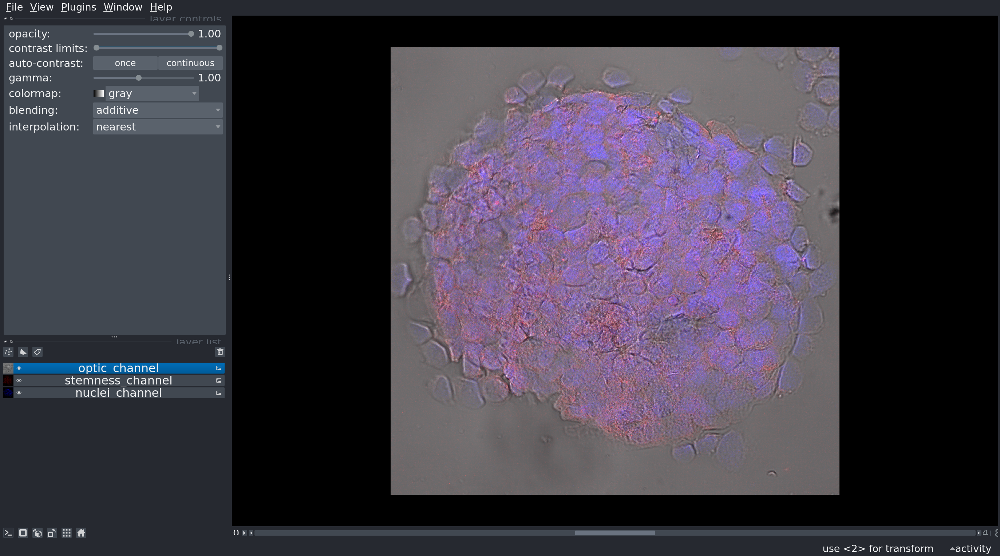

In [24]:
# We never close the napari window and can take a screenshot whenever we like
nbscreenshot(viewer)

Some comments about the viewer:
- In “File” there are options for saving a Screenshot to disc, both with and without the viewer
- The buttons on the bottom left corner are for:
    - Using an ipython command line (only when using napari as a stand alone application, not when you're using it from a notebook)
    - Showing/Hiding the bar that moves you through slices (when hiding, a 3D representation is attempted)
    - Rotate the order in which the axes are displaied (in this case is not that useful due to the small number of $z$ slices)
    - Transposing the image
    - Toggling grid mode (grid mode shows all the channels separately, organized in a grid)
 
Let's see an example of the 3D rendering

Note: napari has some really powerful manual annotation tools, which I'm not interested in right now, but you can see a tutorial [here](https://github.com/sofroniewn/napari-training-course/blob/master/lessons/01_manual_annotation.ipynb) (with a video [here](https://www.youtube.com/watch?v=VgvDSq5aCDQ&t=1635s)).

Some important concepts are for instance the type of layers, cause it corresponds to the type of data:
- Image layer: the data corresponds to an array of pixels
- Shapes layer: the data contains vertices of any drew polygons; you can draw the polygons by indicating the vertices
- Labels layer: like a binary mask, but for many objects (so the values are integers, but not necessarily bools); you can paint with brushes on them
- Points layer: you can draw points (shperes) on them, mainly for anotation
- Surface layer: for meshes and vector fileds

You can also use `magicgui` to add key-bindings that execute some functions, and sliders for interactively modifying parameters.

## Accessing Individual Layers

In [25]:
# we can access the points as
viewer.layers['stemness_channel'].data

array([[[ 287, 1194, 2696, ..., 1122,  983,  744],
        [2354,  912, 1109, ...,  238, 1656, 2049],
        [ 125,  766,  895, ...,  275, 2724, 1743],
        ...,
        [ 414, 2057,  975, ..., 2404, 1087, 2974],
        [1129,  891,  467, ...,  641, 3074, 3031],
        [ 180, 1045,  292, ..., 1718, 1118, 2768]],

       [[ 551, 3659, 1363, ...,  990,  656, 2638],
        [3901,  648,  515, ...,  925,  297, 1853],
        [ 805,  316, 1853, ..., 2329, 1093, 1649],
        ...,
        [2185, 1018, 1112, ..., 1140, 1529,  847],
        [3570, 1000,  804, ..., 2324,  906, 1526],
        [1374,  337, 3118, ..., 1700,  278,  306]],

       [[1438,  121, 1112, ...,  395,  644, 1158],
        [ 343, 1535, 2104, ..., 1632, 1358, 2192],
        [ 327,  959, 1246, ..., 2345, 1699, 2419],
        ...,
        [ 140,  301, 1026, ..., 1340,  487,  339],
        [1694,  545,  547, ...,  297,  308, 1720],
        [ 303, 2536,  205, ...,  254, 1762, 2487]],

       ...,

       [[ 747, 1951,  43

In [26]:
# We can also query them by doing (this says that we have 9 slices -- z componenet)
len(viewer.layers['stemness_channel'].data)

9

In [27]:
# the number of y components can be accessed as with any array
len(viewer.layers['stemness_channel'].data[0])

2292

This is the way in which we can access, change, and reasign the values for the layers.

# Filtering the images
Napari is well integrated with scikit-image, so I'll that library for filtering. You can see an example usage [here](https://github.com/sofroniewn/napari-training-course/blob/master/lessons/02_interactive_analysis.ipynb).

My first-hand approach will be:
- a white top-hat morphology filter for the SOX2 layer
- gauusian/top-hat/thresholding and then stardist segmentation for the nuclei layer
- gaussian/closing and then watershed/cellpose cytoplasm segmentation for the optic layer

## SOX2 Layer

### Reconstruction
Let's first try using morphological reconstruction to create a background image, which we can subtract from the original image to isolate bright features (regional maxima). See the [Scikit-image example](https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_regional_maxima.html#sphx-glr-auto-examples-color-exposure-plot-regional-maxima-py).


In [28]:
stemness_array = np.copy(viewer.layers['stemness_channel'].data)

In [29]:
type(stemness_array)

numpy.ndarray

In [30]:
stemness_array.shape

(9, 2292, 2292)

In [31]:
# Convert to float
stemness_floats_array = img_as_float(stemness_array)

h = 0.5

seed = stemness_floats_array - h
mask = stemness_floats_array

dilated = reconstruction(seed, mask, method='dilation')
hdome = stemness_floats_array - dilated

# Adaptive Equalization
hdome_adapteq = exposure.equalize_adapthist(hdome, clip_limit=0.03)


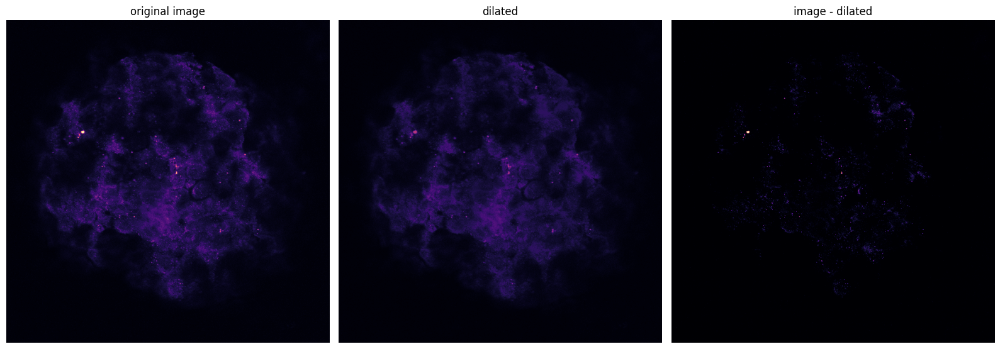

In [32]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,
                                    ncols=3,
                                    figsize=(16, 8),
                                    sharex=True,
                                    sharey=True)

ax0.imshow(stemness_floats_array[3], cmap='magma')
ax0.set_title('original image')
ax0.axis('off')

ax1.imshow(dilated[3], vmin=stemness_floats_array[3].min(), vmax=stemness_floats_array[3].max(), cmap='magma')
ax1.set_title('dilated')
ax1.axis('off')

ax2.imshow(hdome[3], cmap='magma')
ax2.set_title('image - dilated')
ax2.axis('off')

fig.tight_layout()

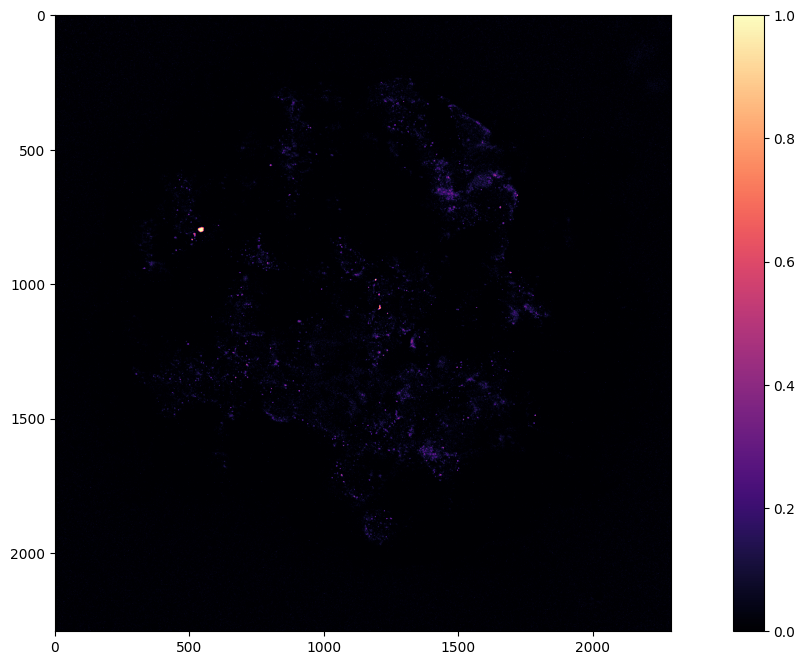

In [33]:
fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(hdome_adapteq[3], cmap='magma')
fig.colorbar(plt.cm.ScalarMappable(norm=None, cmap='magma'), ax=ax)
plt.show()

Mepa que lo mejorcito que puedo obtener es reconstrucción con h=0.5 y luego ecualización adaptativa.

In [36]:
viewer.add_image(hdome_adapteq, name='SOX2-filtered', colormap='red', blending='additive');
# viewer.layers['hdome_adapteq'].name = 'SOX2-filtered'
print(viewer.layers)

[<Image layer 'nuclei_channel' at 0x7f9f86f058a0>, <Image layer 'stemness_channel' at 0x7f9fd011e7a0>, <Image layer 'optic_channel' at 0x7f9f86f46500>, <Image layer 'SOX2-filtered' at 0x7f9fa700fd30>]


## Nuclei Layer

For this layer we'll do instance segmentation. Esto lo puedo hacer por ahora con imágenes 2D. El esferoide está muy aplastado, parecen ser dos capas de células nomás. De las 9 imágenes, las útiles son la 3, la 4 y la 5. La 3 muestra un grupo de células por encima del resto y la 5 muestra la capa que está debajo. La 4 parece agarrar todo lo mejor posible, así que voy a ir con esa.

In [37]:
from skimage import exposure, morphology
from skimage.filters import threshold_otsu
from stardist.models import StarDist2D
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import square, opening
from skimage.restoration import denoise_bilateral
from skimage.segmentation import find_boundaries

In [38]:
# 1. Histogram equalization on the 3D image
image_3d = np.copy(viewer.layers['nuclei_channel'].data)
image_2d = image_3d[3]

# Adaptive Histogram Equalization
image_3d_equalized = exposure.equalize_adapthist(image_3d) 

# 2. Extract a 2D slice from the equalized 3D image
image_2d_equalized = image_3d_equalized[3]

In [50]:
# 3. Morphological opening to remove small noise
selem = morphology.disk(2)  # using a disk-shaped structuring element of radius 2
image_2d_opened = morphology.opening(image_2d_equalized, selem)
image_2d_opened = morphology.area_closing(image_2d_opened, area_threshold=150)


(-0.5, 2291.5, 2291.5, -0.5)

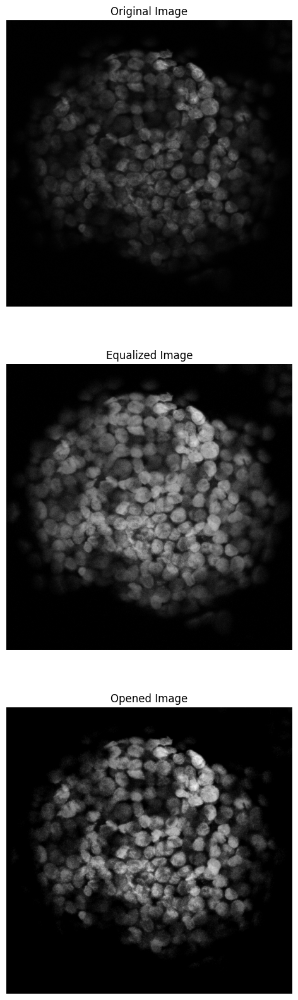

In [52]:
# Plotting the original, equalized, and opened images
fig, axes = plt.subplots(3, 1, figsize=(12, 20))
ax = axes.ravel()

ax[0].imshow(image_2d, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

ax[2].imshow(image_2d_opened, cmap='gray')
ax[2].set_title("Opened Image")
ax[2].axis('off')

In [53]:
# 4. Bilateral Filtering (denoising without bluring edges)
image_opened_bilateral = denoise_bilateral(image_2d_opened, sigma_color=0.05, sigma_spatial=15)


In [54]:
# 5. Load pretrained StarDist 2D model for fluorescent images
model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Perform instance segmentation on the normalized binary image
labels, details = model.predict_instances(image_opened_bilateral)


Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 [==============================] - 1s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


2023-10-26 16:35:17.789653: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-10-26 16:35:17.929144: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-10-26 16:35:19.919451: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.


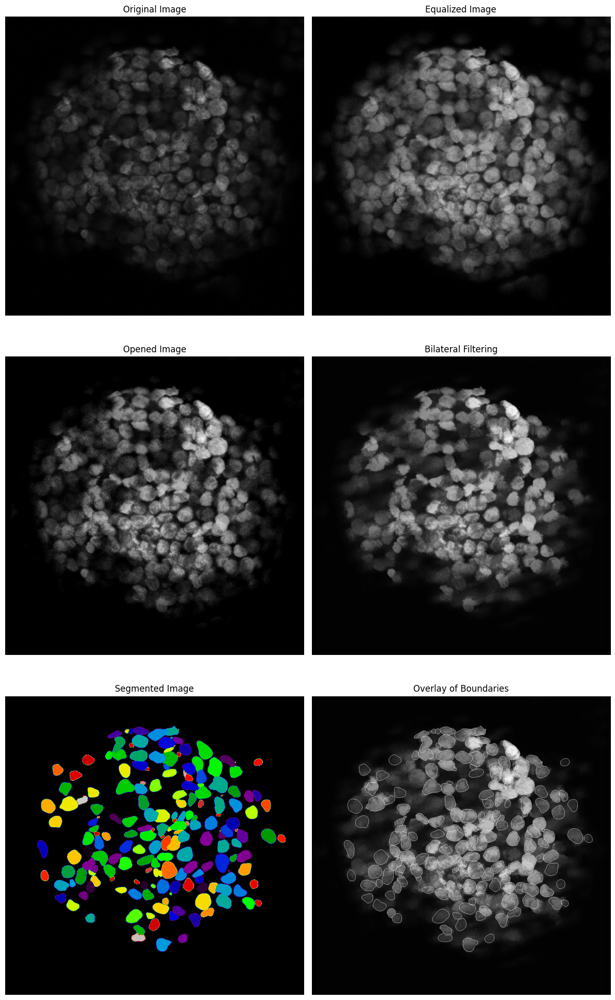

In [55]:
# Extract boundaries from the labels
boundaries = find_boundaries(labels)

# Overlay boundaries on the opened, filtered image
overlay = np.copy(image_opened_bilateral)
overlay[boundaries] = np.max(image_opened_bilateral)  # setting the boundary pixels to the maximum value of the image for visualization

# ----------------------------------


# Plotting the original, equalized, opened, and segmented images
fig, axes = plt.subplots(3, 2, figsize=(12, 20))
ax = axes.ravel()

ax[0].imshow(image_2d, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

ax[2].imshow(image_2d_opened, cmap='gray')
ax[2].set_title("Opened Image")
ax[2].axis('off')

ax[3].imshow(image_opened_bilateral, cmap='gray')
ax[3].set_title("Bilateral Filtering")
ax[3].axis('off')

ax[4].imshow(labels, cmap='nipy_spectral')
ax[4].set_title("Segmented Image")
ax[4].axis('off')

ax[5].imshow(overlay, cmap='gray')
ax[5].set_title("Overlay of Boundaries")
ax[5].axis('off')

plt.tight_layout()
plt.show()

Armamos un `DataFrame` con las características geométricas.

In [98]:
import numpy as np
import pandas as pd
from skimage.measure import regionprops, regionprops_table

# Assuming labels is already defined and contains the segmentation results

spacing = (1.2364633517553391e-7, 1.2364633517553391e-7)  # in meters for (y, x) dimensions

properties = [
    "label", "area", "centroid", "equivalent_diameter", "bbox_area", "convex_area", "filled_area", "major_axis_length",
    "minor_axis_length", "bbox", "weighted_centroid", "coords",
    "eccentricity", "euler_number", "extent",
    "feret_diameter_max", "max_intensity", "mean_intensity", "min_intensity",
    "orientation", "perimeter", "solidity"
]

# Extract the region properties 
regions = regionprops_table(labels, intensity_image=image_opened_bilateral, properties=properties) # , spacing=spacing

# Convert the result to a DataFrame
df = pd.DataFrame(regions)
df

# Save the DataFrame to a CSV
# df.to_csv("features.csv", index=False)


,label,area,centroid-0,centroid-1,equivalent_diameter,bbox_area,convex_area,filled_area,major_axis_length,minor_axis_length,...,eccentricity,euler_number,extent,feret_diameter_max,max_intensity,mean_intensity,min_intensity,orientation,perimeter,solidity
0,1,3603.0,1665.239245,610.173467,67.730954,4608.0,3688.0,3603.0,74.075912,62.675524,...,0.533026,1,0.781901,76.157731,0.335699,0.259644,0.011560,0.242906,226.651804,0.976952
1,2,4047.0,1261.925871,901.705955,71.783009,6279.0,4126.0,4047.0,97.663264,54.007159,...,0.833186,1,0.644529,100.647901,0.581540,0.367115,0.102446,-1.033301,258.592929,0.980853
2,3,3477.0,1453.093184,1063.915157,66.536110,4697.0,3539.0,3477.0,74.479339,59.739093,...,0.597204,1,0.740260,78.262379,0.605924,0.462964,0.126397,0.097666,222.793939,0.982481
3,4,4508.0,1468.507986,652.628660,75.761229,6052.0,4582.0,4508.0,89.304200,64.683659,...,0.689478,1,0.744878,92.179173,0.381742,0.276703,0.029764,0.183257,256.107648,0.983850
4,5,5388.0,1188.700260,636.231997,82.826413,7280.0,5474.0,5388.0,96.235230,71.935740,...,0.664263,1,0.740110,98.270036,0.536514,0.376618,0.053536,0.528623,281.178716,0.984289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,199,2016.0,1556.001984,1140.624504,50.664099,3038.0,2167.0,2016.0,59.166687,47.822003,...,0.588827,1,0.663594,63.788714,0.447590,0.273582,0.036641,-1.132876,185.438600,0.930318
199,200,994.0,677.288732,1536.100604,35.575274,1440.0,1037.0,994.0,39.496795,34.033779,...,0.507444,1,0.690278,41.677332,0.607406,0.423622,0.166138,-0.634237,124.225397,0.958534
200,201,2922.0,794.220739,746.636550,60.995131,3808.0,2975.0,2922.0,67.132198,55.527423,...,0.562003,1,0.767332,68.731361,0.330999,0.182651,0.034020,0.060083,201.823376,0.982185
201,202,1141.0,1095.652936,1646.527607,38.115172,2067.0,1383.0,1141.0,54.652004,31.014584,...,0.823379,1,0.552008,56.648036,0.448256,0.303779,0.073344,-1.426527,155.089358,0.825018


Como una primera aproximación, en lugar de segmentar usando el canal óptico, hacemos Voronoi con los centroides de los objectos segmentados como puntos (ver [documentación](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.Voronoi.html))

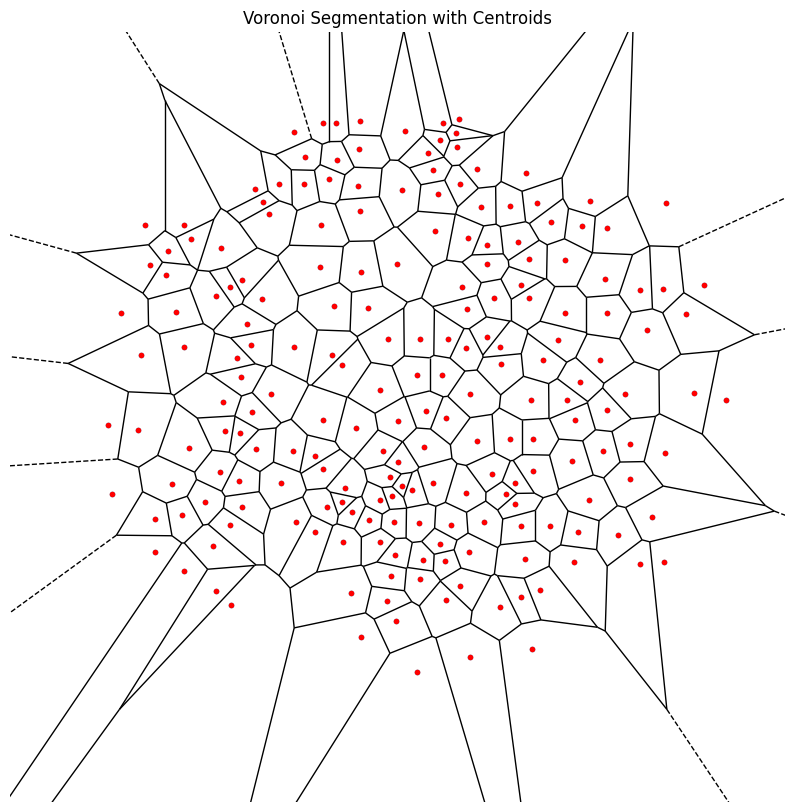

In [112]:
from scipy.spatial import Voronoi, voronoi_plot_2d

# Using the centroids as the points for Voronoi, but making sure we're using (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Note the coordinate reversal here
vor = Voronoi(points)

fig, ax = plt.subplots(figsize=(10, 10))
voronoi_plot_2d(vor, ax=ax, show_points=True, show_vertices=False)

# Display the centroids
for (r, c) in centroids:
    ax.plot(c, r, 'r.')  # plot using (x, y) convention

ax.set_xlim([0, labels.shape[1]])
ax.set_ylim([labels.shape[0], 0])  # invert y-axis to match image coordinates
ax.set_title('Voronoi Segmentation with Centroids')
plt.axis('off')
plt.show()


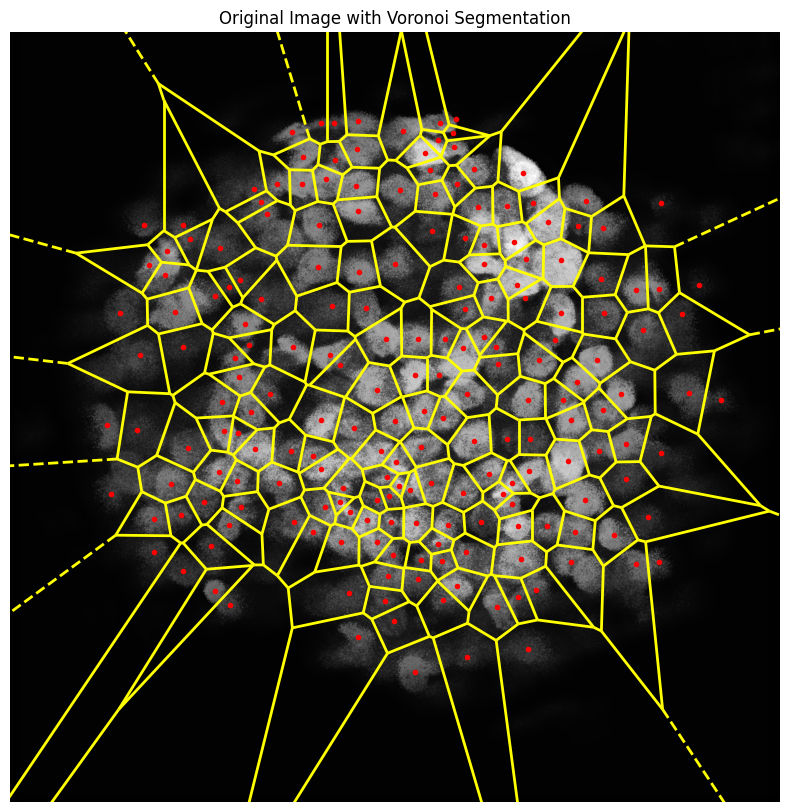

In [109]:
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.pyplot as plt

# Using the centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Overlay the Voronoi diagram without the original Voronoi points
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Display the centroids on top
for (r, c) in centroids:
    ax.plot(c, r, 'r.')  # Using (x, y) convention

ax.set_xlim([0, labels.shape[1]])
ax.set_ylim([labels.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Image with Voronoi Segmentation')
plt.axis('off')
plt.show()


In [128]:
import numpy as np
from scipy.spatial import Voronoi, distance
import skimage

hdome3 = hdome[3]

# Create a blank image for Voronoi segmentation
voronoi_regions = np.zeros_like(hdome3, dtype=int)

# Generate Voronoi regions
points = np.array([(c, r) for r, c in centroids])
vor = Voronoi(points)

intensity_sums = [0] * len(centroids)  # Initialize intensity sums with zeros

for region in vor.regions:
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon = [vor.vertices[i] for i in region]
        if len(polygon) > 2:  # Ensure that we have a valid polygon with more than 2 vertices
            rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], voronoi_regions.shape)
            
            # Determine which centroid this region belongs to based on proximity
            region_centroid = (np.mean(rr), np.mean(cc))
            idx = np.argmin([distance.euclidean(region_centroid, cent) for cent in centroids])
            
            voronoi_regions[rr, cc] = idx + 1  # Add 1 to avoid using zero as a label
            intensity_sums[idx] += np.sum(hdome3[rr, cc])  # Update the intensity sum for this region

# Add the intensity sums to the dataframe
df['Fluorescence_Intensity'] = intensity_sums



In [129]:
df['Fluorescence_Intensity']

0       34.647990
1       52.249500
2       25.716670
3       51.229259
4       44.875029
          ...    
198     39.212909
199    134.458556
200     22.432341
201     26.459098
202      9.166659
Name: Fluorescence_Intensity, Length: 203, dtype: float64

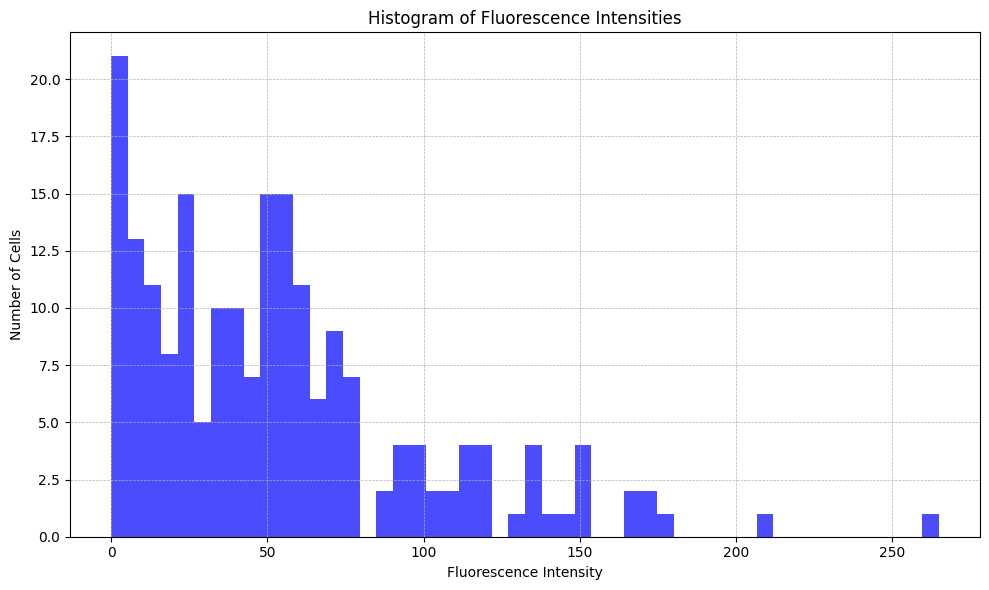

In [130]:
import matplotlib.pyplot as plt

# Histogram of Fluorescence Intensities
plt.figure(figsize=(10, 6))
plt.hist(df['Fluorescence_Intensity'], bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Fluorescence Intensities')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


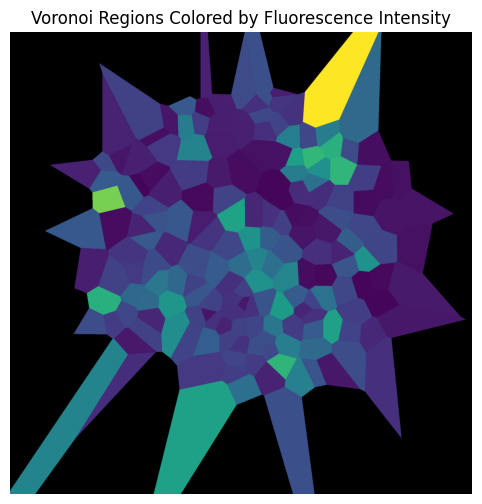

In [131]:
# Create an empty image to overlay the Voronoi regions
colored_voronoi = np.zeros(hdome3.shape + (3,), dtype=np.uint8)

# Map the fluorescence intensities to a colormap
norm = mcolors.Normalize(vmin=df['Fluorescence_Intensity'].min(), vmax=df['Fluorescence_Intensity'].max())
colormap = plt.cm.viridis  # You can choose a different colormap if desired

for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], hdome3.shape)
        
        # Check if rr and cc are not empty
        if len(rr) > 0 and len(cc) > 0:
            # Get the color corresponding to the fluorescence intensity
            color = colormap(norm(df.at[point_idx, 'Fluorescence_Intensity']))[:3]
            color = tuple(int(c*255) for c in color)
        
            colored_voronoi[rr, cc] = color

# Display the colored Voronoi regions
plt.figure(figsize=(10, 6))
plt.imshow(colored_voronoi)
plt.title('Voronoi Regions Colored by Fluorescence Intensity')
plt.axis('off')
plt.show()




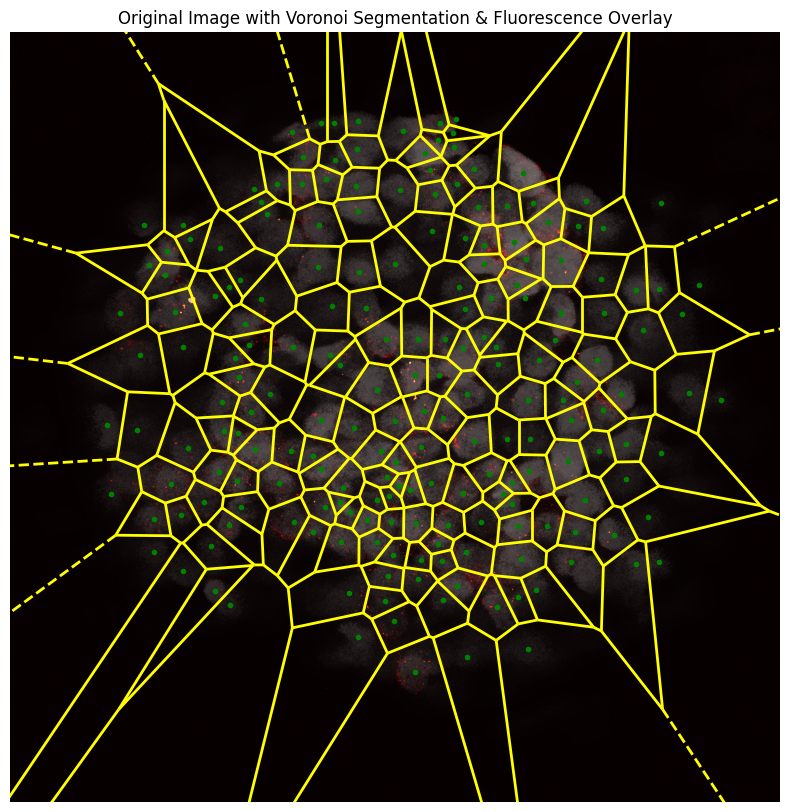

In [127]:
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.pyplot as plt

# Using the centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Overlay the Voronoi diagram without the original Voronoi points
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Here, I assume fluorescence_image represents your fluorescence channel.
ax.imshow(hdome[3], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids on top
for (r, c) in centroids:
    ax.plot(c, r, 'g.')  # Using (x, y) convention

ax.set_xlim([0, labels.shape[1]])
ax.set_ylim([labels.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Image with Voronoi Segmentation & Fluorescence Overlay')
plt.axis('off')
plt.show()


## Optic layer

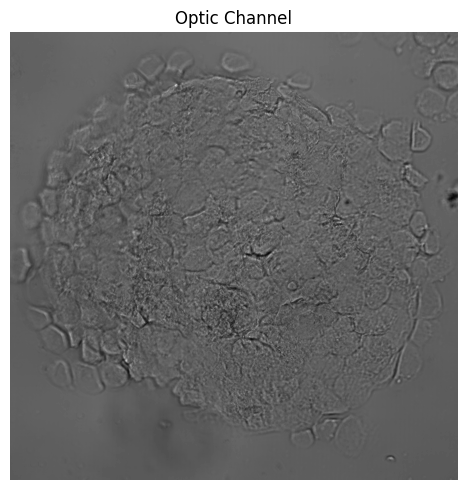

In [71]:
# Plotting the overlay
fig, ax = plt.subplots(figsize=(5, 5))

ax.imshow(optic_channel[3], cmap='gray')

# ax.set_title("Original with Overlay")
# ax.set_title("Equalized with Overlay")
ax.set_title("Optic Channel")

ax.axis('off')

plt.tight_layout()
plt.show()


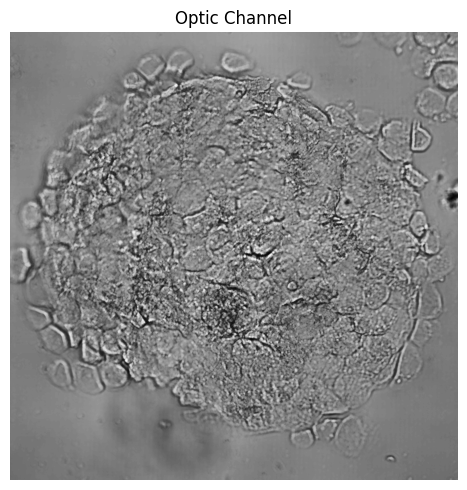

In [75]:
# 1. Histogram equalization on the 3D image
image_3d = np.copy(viewer.layers['optic_channel'].data)
 
# Adaptive Histogram Equalization
image_3d_equalized = exposure.equalize_adapthist(image_3d) 

# 2. Extract a 2D slice from the equalized 3D image
image_2d_equalized = image_3d_equalized[3]

# Plotting the overlay
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(image_2d_equalized, cmap='gray')
ax.set_title("Optic Channel")
ax.axis('off')

plt.tight_layout()
plt.show()


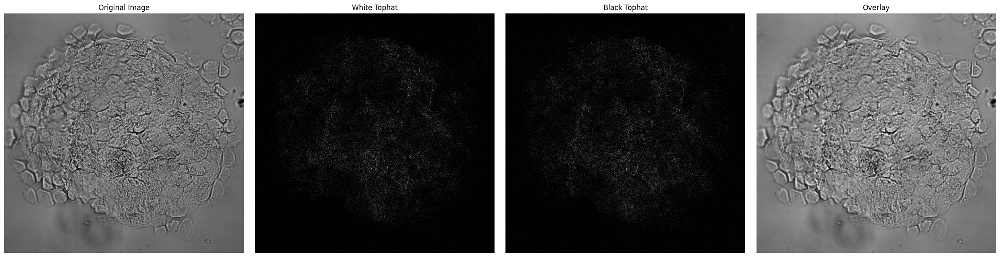

In [76]:
from skimage.morphology import white_tophat, black_tophat, disk

# Define the structuring element
selem = disk(3)  # You can adjust the radius based on the scale of features you're targeting

# Apply the white tophat operation
image_2d_white_tophat = white_tophat(image_2d_equalized, selem)

# Apply the black tophat operation
image_2d_black_tophat = black_tophat(image_2d_equalized, selem)

# Plotting the original, equalized, white tophat, and black tophat images
fig, axes = plt.subplots(1, 4, figsize=(24, 6))
ax = axes.ravel()

ax[0].imshow(image_2d_equalized, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_white_tophat, cmap='gray')
ax[1].set_title("White Tophat")
ax[1].axis('off')

ax[2].imshow(image_2d_black_tophat, cmap='gray')
ax[2].set_title("Black Tophat")
ax[2].axis('off')

# Reducing noise with white and black tophat
denoised = image_2d_equalized - image_2d_white_tophat + image_2d_black_tophat
ax[3].imshow(denoised, cmap='gray')
ax[3].set_title("Overlay")
ax[3].axis('off')

plt.tight_layout()
plt.show()
